In [2]:
!git clone https://github.com/TariqBerrada/Motion-Denoising

fatal: destination path 'Motion-Denoising' already exists and is not an empty directory.


## Download necessary data

In [3]:
%cd Motion-Denoising
%mkdir weights
%mkdir -p data/db
%cd data/db
!gdown https://drive.google.com/uc?id=1bsg7atlQGhsxIKzNQfyTD61aro5Xk9A_
%cd ../..

/content/Motion-Denoising
mkdir: cannot create directory ‘weights’: File exists
/content/Motion-Denoising/data/db
Downloading...
From: https://drive.google.com/uc?id=1bsg7atlQGhsxIKzNQfyTD61aro5Xk9A_
To: /content/Motion-Denoising/data/db/database.pt
100% 1.87G/1.87G [00:07<00:00, 259MB/s]
/content/Motion-Denoising


In [4]:
%cd weights
# !gdown https://drive.google.com/uc?id=1w12WoAa_9ypOQCbbmxzlrU2WVsvW3r5N
!gdown https://drive.google.com/uc?id=13UzduMiT-_e73kk3-tManvPFhC0q7dC7
%cd ..

/content/Motion-Denoising/weights
Downloading...
From: https://drive.google.com/uc?id=13UzduMiT-_e73kk3-tManvPFhC0q7dC7
To: /content/Motion-Denoising/weights/ckpt.pth
100% 9.81M/9.81M [00:00<00:00, 86.5MB/s]
/content/Motion-Denoising


In [5]:
%cd data/db

/content/Motion-Denoising/data/db


In [6]:
import joblib
data = joblib.load('database.pt')
for k, v in data.items():
  data[k] = data[k][::5, :]
  print(k, data[k].shape)
joblib.dump(data, 'database.pt')
del data

pose (294060, 156)
trans (294060, 3)


In [7]:
%cd ../..

/content/Motion-Denoising


In [8]:
!git checkout experimental

M	__pycache__/config.cpython-37.pyc
M	models/__pycache__/model.cpython-37.pyc
M	utils/__pycache__/render.cpython-37.pyc
Already on 'experimental'
Your branch is up to date with 'origin/experimental'.


In [9]:
!git pull origin experimental

From https://github.com/TariqBerrada/Motion-Denoising
 * branch            experimental -> FETCH_HEAD
Already up to date.


In [ ]:
!git reset --hard

HEAD is now at 681d3f2 experimenting with cos


In [10]:
!pip install git+https://github.com/nghorbani/body_visualizer
!pip install git+https://github.com/MPI-IS/configer.git
!pip install git+https://github.com/MPI-IS/mesh.git

!pip install trimesh
!pip install pyrender
!pip install git+https://github.com/nghorbani/human_body_prior

  Cloning https://github.com/nghorbani/body_visualizer to /tmp/pip-req-build-911eqffq
  Running command git clone -q https://github.com/nghorbani/body_visualizer /tmp/pip-req-build-911eqffq
  Cloning https://github.com/MPI-IS/configer.git to /tmp/pip-req-build-tev3tok8
  Running command git clone -q https://github.com/MPI-IS/configer.git /tmp/pip-req-build-tev3tok8
  Cloning https://github.com/MPI-IS/mesh.git to /tmp/pip-req-build-yoop44xg
  Running command git clone -q https://github.com/MPI-IS/mesh.git /tmp/pip-req-build-yoop44xg
  Cloning https://github.com/nghorbani/human_body_prior to /tmp/pip-req-build-0128ef78
  Running command git clone -q https://github.com/nghorbani/human_body_prior /tmp/pip-req-build-0128ef78


# Train model

In [ ]:
!python train.py

  0% 0/150 [00:00<?, ?it/s]0 - train_loss : 0.0014096309800119796 - validation_loss : 0.001407063162214114
  1% 1/150 [00:36<1:30:48, 36.57s/it]1 - train_loss : 0.001407240693085795 - validation_loss : 0.0014075228594390987
  1% 2/150 [01:12<1:28:55, 36.05s/it]2 - train_loss : 0.001405586008473269 - validation_loss : 0.00140790404052724
  2% 3/150 [01:47<1:27:55, 35.88s/it]3 - train_loss : 0.0014055010466188717 - validation_loss : 0.0014085897837967513
  3% 4/150 [02:23<1:27:08, 35.81s/it]4 - train_loss : 0.0014047468165868742 - validation_loss : 0.0014086893072973454
  3% 5/150 [02:59<1:26:25, 35.76s/it]5 - train_loss : 0.001403947900300414 - validation_loss : 0.001408695996249524
  4% 6/150 [03:36<1:26:35, 36.08s/it]6 - train_loss : 0.00140340583369674 - validation_loss : 0.0014089892885599511
  5% 7/150 [04:11<1:25:40, 35.95s/it]7 - train_loss : 0.0014025512653281556 - validation_loss : 0.001409475538898129
  5% 8/150 [04:47<1:24:53, 35.87s/it]8 - train_loss : 0.0014024372855830354 

(-0.5, 2299.5, 999.5, -0.5)

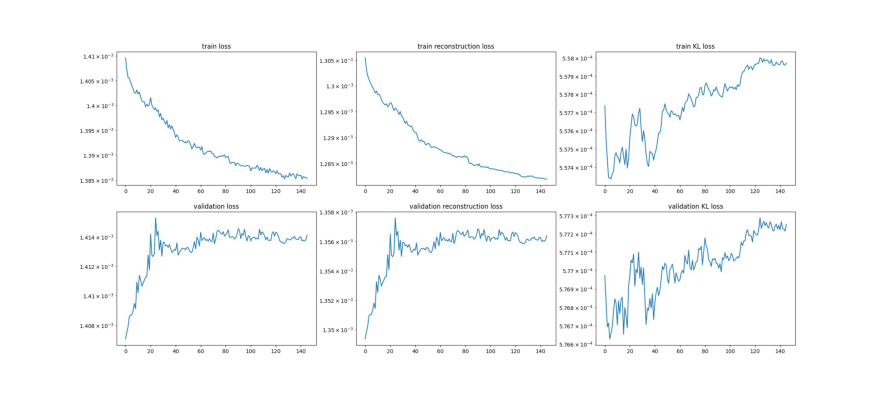

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize = (20, 7))
plot = plt.imread('learning.jpg')
plt.imshow(plot)
plt.axis('off')

# Evaluate performan of the trained model.

In [11]:
import os
os.environ['PYOPENGL_PLATFORM'] = 'egl'

In [ ]:
!python test.py

Running reconstruction test.
Rendering animation : 150 frames - 120 frames/sec. - resolution(600, 600)
OpenCV: FFMPEG: tag 0x58564944/'DIVX' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'
100% 150/150 [00:07<00:00, 20.17it/s]
Rendering animation : 150 frames - 120 frames/sec. - resolution(600, 600)
OpenCV: FFMPEG: tag 0x58564944/'DIVX' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'
100% 150/150 [00:07<00:00, 19.47it/s]
Running interpolation test.
Rendering animation : 250 frames - 120 frames/sec. - resolution(600, 600)
OpenCV: FFMPEG: tag 0x58564944/'DIVX' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'
100% 250/250 [00:12<00:00, 20.21it/s]
Rendering animation : 250 frames - 120 frames/sec. - resolution(600, 600)
OpenCV: FFMPEG: tag 0x58564944/'DIV

In [ ]:
from google.colab import files
files.download('weights/ckpt.pth') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import files
files.download('renderings/preds.jpg') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

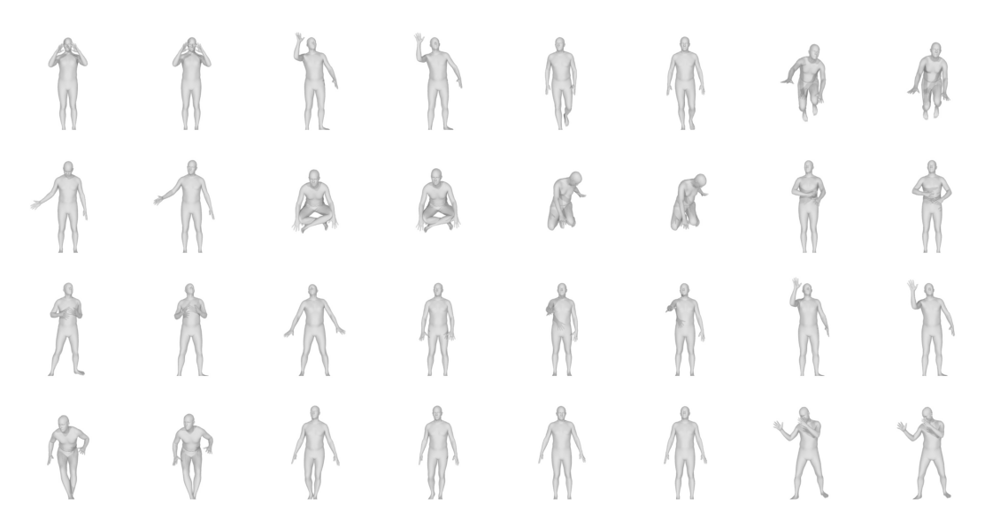

In [ ]:
preds_example = plt.imread('renderings/preds.jpg')
plt.figure(figsize = (20, 26))
plt.imshow(preds_example)
plt.axis(('off'))
plt.show()

In [ ]:
from IPython.display import HTML
from base64 import b64encode
 
def show_video(video_path, video_width = 600):
   
  video_file = open(video_path, "r+b").read()
 
  video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
  return HTML(f"""<video width={video_width} controls><source src="{video_url}"></video>""")
 
show_video('renderings/interpolation_p.mp4')

In [ ]:
files.download('renderings/interpolation_p.mp4') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Trajectory analysis

In [12]:
from models.model import Network
import torch

import numpy as np
from utils.render import render_pose, render_pose_sequence

from moviepy.editor import *

import matplotlib.pyplot as plt
plt.style.use('seaborn')

model = Network(63, 28).cuda()
model.load_state_dict(torch.load('weights/ckpt.pth', map_location='cpu'))

data = joblib.load('data/db/database.pt')
pose0 = torch.tensor(data['pose'][[32], 3:66], dtype = torch.float32, device ='cuda')
pose1 = torch.tensor(data['pose'][[173], 3:66], dtype = torch.float32, device ='cuda')

In the following experiment, we will render a random animation from our test set, its corresponding reconstruction, and its t-SNE distribution.

In [15]:
pose_seq = torch.tensor(data['pose'][190:290, 3:66], dtype = torch.float32, device='cuda')
pose_pred, _, _ = model(pose_seq)
render_pose_sequence(pose_seq, out_dir='renderings/sequence_gt.avi')
render_pose_sequence(pose_pred, out_dir='renderings/sequence_p.avi')

Rendering animation : 100 frames - 60 frames/sec. - resolution(600, 600)


100%|██████████| 100/100 [00:05<00:00, 18.24it/s]


Rendering animation : 100 frames - 60 frames/sec. - resolution(600, 600)


100%|██████████| 100/100 [00:05<00:00, 18.26it/s]


In [ ]:
clip_gt=VideoFileClip("renderings/sequence_gt.avi" )
clip_gt.ipython_display(width=350)

100%|██████████| 200/200 [00:00<00:00, 254.12it/s]


In [ ]:
clip_p=VideoFileClip("renderings/sequence_p.avi" )
clip_p.ipython_display(width=350)

100%|██████████| 200/200 [00:00<00:00, 267.54it/s]


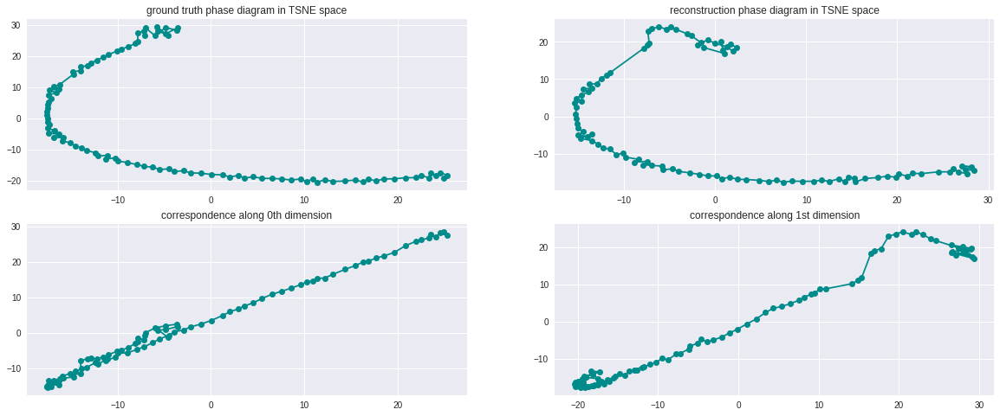

In [43]:
from sklearn.manifold import TSNE

pose_c = TSNE(n_components=2, learning_rate='auto', init='pca', perplexity=9).fit_transform(pose_seq.detach().cpu().numpy())
rec_r = TSNE(n_components=2, learning_rate='auto', init='pca', perplexity=9).fit_transform(pose_pred.detach().cpu().numpy())

fig, ax = plt.subplots(2, 2, figsize = (20, 8))
ax[0][0].plot(pose_c[:, 0], pose_c[:, 1], 'o-', c='darkcyan')
ax[0][0].set_title('ground truth phase diagram in TSNE space')
ax[0][1].plot(rec_r[:, 0], rec_r[:, 1], 'o-', c='darkcyan')
ax[0][1].set_title('reconstruction phase diagram in TSNE space')

ax[1][0].plot(pose_c[:, 0], rec_r[:, 0], 'o-', c='darkcyan')
ax[1][0].set_title('correspondence along 0th dimension')
ax[1][1].plot(pose_c[:, 1], rec_r[:, 1], 'o-', c='darkcyan')
ax[1][1].set_title('correspondence along 1st dimension')
plt.show()

Normally, we would get something almost linear for the correspondences, which is clearly not the case, even though the animations are very similar, could this be related to the rotation format that we are using to encode this data ?

The figures above translate the effects of the presence of nois in the reconstruction, as can be seen in the animations and the chaotic jumps within the t-SNE correspondences.

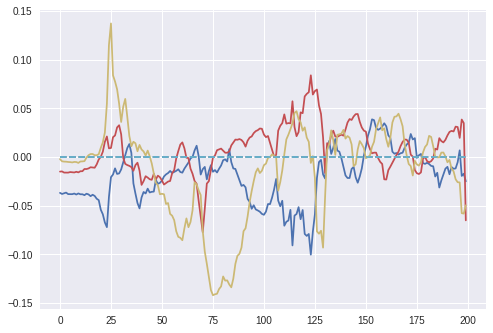

In [26]:
pred = pose_pred.detach().cpu().numpy()
pred = pred.reshape(pred.shape[0], -1, 3)

gt = pose_seq.detach().cpu().numpy()
gt = gt.reshape(gt.shape[0], -1, 3)

n = 9

plt.figure()
for i in range(3):
  plt.plot(pred[:, n, i])
  plt.plot(gt[:, n, i], '--')

plt.show()

What about interpolated plots in rotation space and the Variational Autoencoder's latent space ?

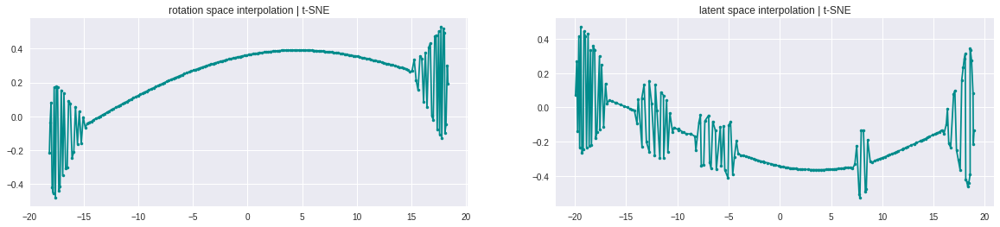

In [44]:
pose0 = pose_seq[[0], :]
pose1 = pose_seq[[-1], :]

pose_rot_torch = torch.cat([w*pose0 + (1-w)*pose1 for w in np.linspace(0, 1, 200)])
pose_latent_torch, _, _ = model(pose_rot_torch)

pose_rot = pose_rot_torch.detach().cpu().numpy()
pose_latent = pose_latent_torch.detach().cpu().numpy()

pose_c = TSNE(n_components=2, learning_rate='auto', init='pca').fit_transform(pose_rot)
rec_r = TSNE(n_components=2, learning_rate='auto', init='pca').fit_transform(pose_latent)

fig, ax = plt.subplots(1, 2, figsize = (20, 4))
ax[0].plot(pose_c[:, 0], pose_c[:, 1], '.-', c='darkcyan')
ax[0].set_title('rotation space interpolation | t-SNE')
ax[1].plot(rec_r[:, 0], rec_r[:, 1], '.-', c='darkcyan')
ax[1].set_title('latent space interpolation | t-SNE')
plt.show()

In [ ]:
render_pose_sequence(pose_rot_torch, out_dir='renderings/interpolation_rot.avi')

clip=VideoFileClip("renderings/interpolation_rot.avi" )
clip.ipython_display(width=350)

Rendering animation : 200 frames - 60 frames/sec. - resolution(600, 600)


100%|██████████| 200/200 [00:00<00:00, 268.94it/s]


In [ ]:
render_pose_sequence(pose_latent_torch, out_dir='renderings/interpolation_latent.avi')

clip=VideoFileClip("renderings/interpolation_latent.avi" )
clip.ipython_display(width=350)

Rendering animation : 200 frames - 60 frames/sec. - resolution(600, 600)


100%|██████████| 200/200 [00:00<00:00, 259.18it/s]


From the images above we can see that the latent space interpolation yields more constrained movements, but the movement progression in general is more plausible and realistic than simple interpolation in the original rotation space.

# Reconstruction of a noised animation

Here we will add homoscedatic noise to each joint rotation and try to reconstruct a smooth version of the ground truth.

The noise is modeled by i.i.d centered normal distributions, with a standard deviation of $\sigma = 0.1$

In [16]:
poses = torch.tensor(data['pose'][4150:4350, 3:66], dtype = torch.float32, device='cuda')
render_pose_sequence(poses, out_dir='renderings/sequence_0.avi')

clip=VideoFileClip("renderings/sequence_0.avi" )
clip.ipython_display(width=350)

Rendering animation : 200 frames - 60 frames/sec. - resolution(600, 600)


100%|██████████| 200/200 [00:00<00:00, 250.33it/s]


In [17]:
torch.manual_seed(0)
noise = torch.normal(0, 0.03, size = poses.shape, device = poses.device, dtype = torch.float32)

noised = poses + noise

render_pose_sequence(noised, out_dir='renderings/sequence_noised.avi')

clip=VideoFileClip("renderings/sequence_noised.avi" )
clip.ipython_display(width=350)

Rendering animation : 200 frames - 60 frames/sec. - resolution(600, 600)


100%|██████████| 200/200 [00:00<00:00, 217.69it/s]


## Gradient descent for constrained optimization

In this section, we follow a gradient descent approach in order to optimize a randomly generated sequence.

The loss function will consist of a recontruction term and a gradient penalty term.

$$L = ||x-\hat{x}||_2^2\ +\ \beta||\nabla \hat{x}||_2^2$$

100%|██████████| 5000/5000 [00:09<00:00, 554.31it/s]


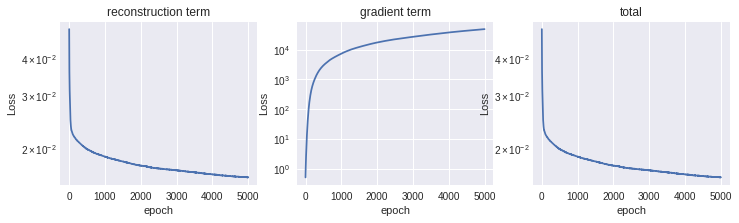

In [18]:
import tqdm
from torch.autograd import Variable

z = Variable(torch.rand((200, 28), device = poses.device, dtype = torch.float32), requires_grad = True)

n_iter = 5000
lr = 0.2
beta = 0.00
optimizer=  torch.optim.Adam([z], lr = lr)

logs = {'rec' : [], 'grad' : [], 'tot' : []}

for i in tqdm.tqdm(range(n_iter)):
  optimizer.zero_grad()
  y = model.decode(z)
  loss_rec = (y - noised)**2
  # loss_grad = (z[1:, :] - z[:-1, :])**2
  loss_grad = (z[2:, :] - 2*z[1:-1] + z[:-2])**2
  loss = loss_rec.mean() + beta*(loss_grad).mean()

  logs['rec'].append(loss_rec.mean().item())
  logs['grad'].append(loss_grad.mean().item())
  logs['tot'].append(loss.item())

  loss.backward()
  optimizer.step()


fig, ax = plt.subplots(1, 3, figsize = (12, 3))

ax[0].semilogy(logs['rec'])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('Loss')
ax[0].set_title('reconstruction term')

ax[1].semilogy(logs['grad'])
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('Loss')
ax[1].set_title('gradient term')

ax[2].semilogy(logs['tot'])
ax[2].set_xlabel('epoch')
ax[2].set_ylabel('Loss')
ax[2].set_title('total')

plt.show()

In [30]:
result = model.decode(z)

render_pose_sequence(result, out_dir='renderings/result_grad.avi', fps = 25)

clip=VideoFileClip("renderings/result_grad.avi" )
clip.ipython_display(width=350)

Rendering animation : 200 frames - 25 frames/sec. - resolution(600, 600)


100%|█████████▉| 200/201 [00:00<00:00, 247.13it/s]


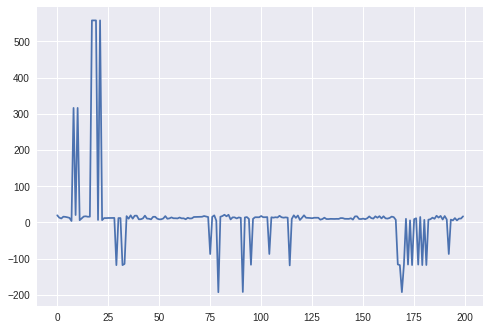

In [45]:
z_np = z.detach().cpu().numpy()
pose_c = TSNE(n_components=1, learning_rate='auto', init='pca').fit_transform(z_np)

plt.plot(pose_c[:, 0])

Most of the details of the animation are lost, we need to think about a better method then.

* What if we initialize with the noised encoding instead ?

100%|██████████| 5000/5000 [00:10<00:00, 474.08it/s]


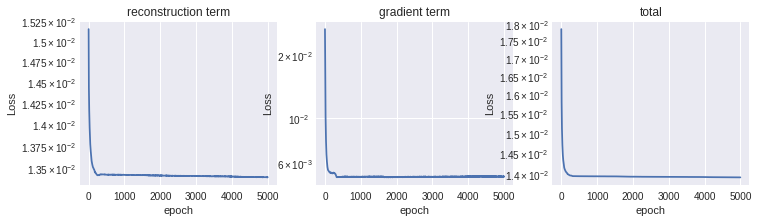

In [31]:
import tqdm
from torch.autograd import Variable

z = Variable(model.encode(noised)[0], requires_grad = True)


n_iter = 5000
lr = 0.01
beta = 0.1
optimizer=  torch.optim.Adam([z], lr = lr)

logs = {'rec' : [], 'grad' : [], 'tot' : []}

for i in tqdm.tqdm(range(n_iter)):
  optimizer.zero_grad()
  y = model.decode(z)
  loss_rec = (y - noised)**2
  # loss_grad = (z[1:, :] - z[:-1, :])**2
  loss_grad = (z[2:, :] - 2*z[1:-1] + z[:-2])**2
  loss = loss_rec.mean() + beta*(loss_grad).mean()

  logs['rec'].append(loss_rec.mean().item())
  logs['grad'].append(loss_grad.mean().item())
  logs['tot'].append(loss.item())

  loss.backward()
  optimizer.step()


fig, ax = plt.subplots(1, 3, figsize = (12, 3))

ax[0].semilogy(logs['rec'])
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('Loss')
ax[0].set_title('reconstruction term')

ax[1].semilogy(logs['grad'])
ax[1].set_xlabel('epoch')
ax[1].set_ylabel('Loss')
ax[1].set_title('gradient term')

ax[2].semilogy(logs['tot'])
ax[2].set_xlabel('epoch')
ax[2].set_ylabel('Loss')
ax[2].set_title('total')

plt.show()

In [32]:
result = model.decode(z)

render_pose_sequence(result, out_dir='renderings/result_grad_x0.avi', fps = 25)

clip=VideoFileClip("renderings/result_grad_x0.avi" )
clip.ipython_display(width=350)

Rendering animation : 200 frames - 25 frames/sec. - resolution(600, 600)


100%|█████████▉| 200/201 [00:00<00:00, 246.04it/s]


## Linear Interpolation on dowsampled data

In [131]:
dx = 10

z, _ = model.encode(noised)
z_padded = z[::dx][None].transpose(2, 1)

z_nearest = torch.nn.functional.interpolate(z_padded, size = z.shape[0], mode = 'nearest').transpose(2, 1)[0]
z_linear = torch.nn.functional.interpolate(z_padded, size = z.shape[0], mode = 'linear', align_corners = True).transpose(2, 1)[0]

z_new = z_padded[None].transpose(1, 2)
z_bicubic = torch.nn.functional.interpolate(z_new, size=(1,z.shape[0]), mode='bicubic')[0, :, 0, :].transpose(0, 1)

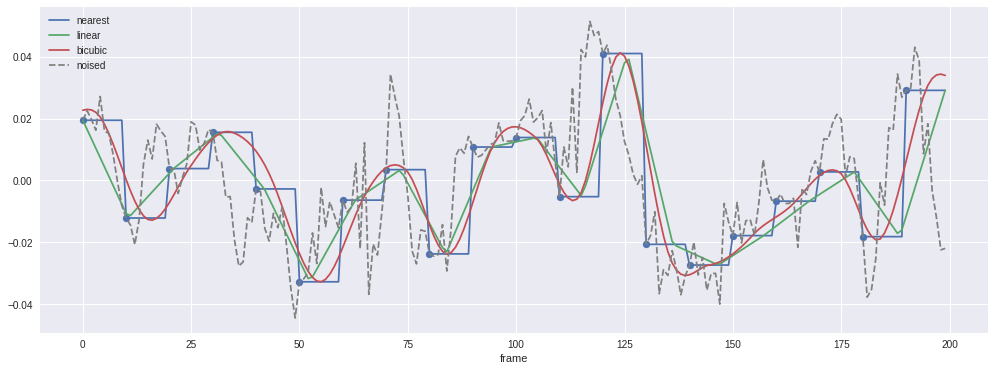

In [136]:
fig, ax = plt.subplots(1, 1, figsize = (17, 6))
ax.plot(z_nearest[:, 5].detach().cpu().numpy(), label='nearest')
ax.plot(z_linear[:, 5].detach().cpu().numpy(), label='linear')
ax.plot(z_bicubic[:, 5].detach().cpu().numpy(), label='bicubic')
ax.plot(z[:, 5].detach().cpu().numpy(), '--', c='gray', label='noised')
ax.scatter(list(range(0, 200, dx)), z[::dx][:, 5].detach().cpu().numpy())
ax.set_xlabel('frame')
ax.legend()

In [133]:
result = model.decode(z_nearest)

render_pose_sequence(result, out_dir='renderings/interp_nearest.avi', fps = 25)

clip=VideoFileClip("renderings/interp_nearest.avi" )
clip.ipython_display(width=350)

Rendering animation : 200 frames - 25 frames/sec. - resolution(600, 600)


100%|█████████▉| 200/201 [00:00<00:00, 258.93it/s]


In [134]:
result = model.decode(z_linear)

render_pose_sequence(result, out_dir='renderings/interp_linear.avi', fps = 25)

clip=VideoFileClip("renderings/interp_linear.avi" )
clip.ipython_display(width=350)

Rendering animation : 200 frames - 25 frames/sec. - resolution(600, 600)


100%|█████████▉| 200/201 [00:01<00:00, 129.23it/s]


In [135]:
result = model.decode(z_bicubic)

render_pose_sequence(result, out_dir='renderings/interp_bicubic.avi', fps = 25)

clip=VideoFileClip("renderings/interp_bicubic.avi" )
clip.ipython_display(width=350)

Rendering animation : 200 frames - 25 frames/sec. - resolution(600, 600)


100%|█████████▉| 200/201 [00:00<00:00, 242.32it/s]
